# Tarea 6. Redes generativas adversarias

1. Transforme el código de GAN-Mnist, para que quede todo escrito en clases (subclasing)

2.  Corra al menos 10 iteraciones en Colab o localmente y muestre resultados parciales en su informe

3. Realice un informe completo de la experiencia. 

## Importación de librerías  

In [6]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from IPython.display import clear_output
from IPython import display
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from zipfile import ZipFile
bce = BinaryCrossentropy(from_logits=True)
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
import torchvision.transforms as transforms
from torchvision import datasets
import os
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

%matplotlib inline

# Se usa una semilla para reproductibilidad
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


## Cargar y preparar el conjunto de datos

In [7]:
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])


In [8]:
# Número de workers en el dataloader
workers = 2

# tamaño del lote
batch_size = 128

# tamaño base de las imágenes a la entrada
image_size = 64

# número de canales de entrenamiento
nc = 3

# tamaño delv ector latente
nz = 100

# tamaño de los mapas de características en el generador
ngf = 64

# tamaño de los mapas de características en el discriminador
ndf = 64

# Números de epocas
num_epochs = 5

# rata de aprendizaje
lr = 0.0002

# hiperparámetro Beta1 para el optimizador
beta1 = 0.5

# Número de GPUs, si no hay poner 0
ngpu = 1

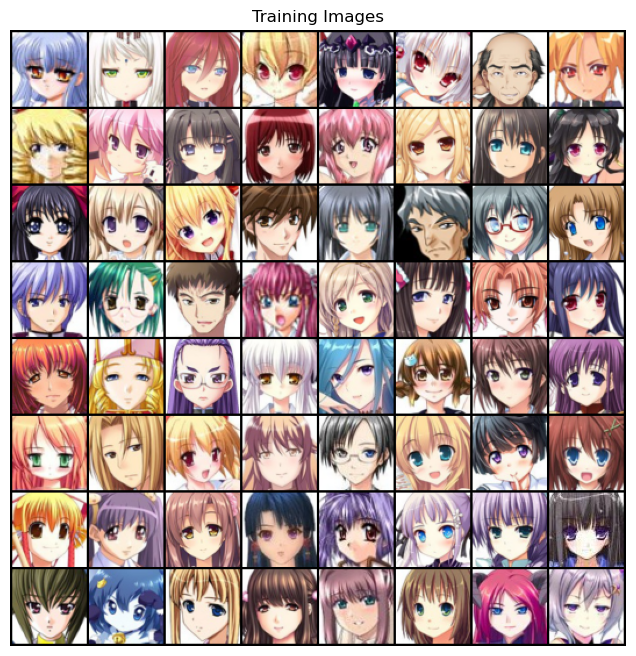

In [9]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt

# Directorio del Dataset
dataroot = "C:\\Users\\Pc\\Desktop\\I.A\\Anime"

# Decidimos en dónde se hará el entrenamiento
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


# Creamos la transformación de las imágenes
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Creamos el dataset
dataset = datasets.ImageFolder(root=dataroot, transform=transform)

# Creamos el dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

# graficamos algunas de sus imágenes
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

In [10]:
# inicialización de pesos para el discriminador y el generador
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [11]:

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Se entra el vector de ruido a la primera convolución transpuesta
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # tamaño actual. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # tamaño actual. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # tamaño actual. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # tamaño actual. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # tamaño actual. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [12]:

# creamos el generador
netG = Generator(ngpu).to(device)

# para uso de múltiples GPUs
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# aplicamos la aleatorización de pesos incializados
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [13]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # entrada es una imagen (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # tamaño actual. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [14]:
# Creamos el discriminador
netD = Discriminator(ngpu).to(device)

# para uso de múltiples GPUs
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# aplicamos la aleatorización de pesos incializados
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [15]:
# perdida de entropía cruzada binaria
criterion = nn.BCELoss()

# hacemos un lote de vectores aleatorios para visualizar
#  el proceso de mejora del generador
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

#definimos las etiquetas de "falso" y "verdadero"
real_label = 1.
fake_label = 0.

# definimos los optimizadores de G y D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [16]:
# Training Loop

# listas para seguir el progreso
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# para cada epoch
for epoch in range(num_epochs):
    # Para cada lote en el epoch
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Actualizamos la red D
        ###########################
        ## entrenamiento con las imágenes reales
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # pasamos el lote de imágenes reales al discriminador
        output = netD(real_cpu).view(-1)
        # perdida del lote real
        errD_real = criterion(output, label)
        # backpropagation
        errD_real.backward()
        D_x = output.mean().item()

        ## entrenamiento con las imágenes falsas
        # Generamos lote de vectores aleatorios
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generamos imágenes falsas con G
        fake = netG(noise)
        label.fill_(fake_label)
        # Aplicamos clasificación de estos lotes falsos
        output = netD(fake.detach()).view(-1)
        # perdida del lote falso
        errD_fake = criterion(output, label)
        # calculamos los gradientes de este lote, acumulado con el anterior
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # computamos la perdida total de D como la suma de perdidas
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Actualizamos la red G
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        # al haber actualizado D, se hace otro paso con datos falsos usando el discriminador
        output = netD(fake).view(-1)
        # Calculamos la perdida del generador con base en que tan buena fue su capacidad de burlar a D
        errG = criterion(output, label)
        # Calculamos Gradientes
        errG.backward()
        D_G_z2 = output.mean().item()
        # actualizamos G
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # hacemos unas generaciones parciales para ver el desempeño de G
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/497]	Loss_D: 1.8918	Loss_G: 4.2939	D(x): 0.4844	D(G(z)): 0.5840 / 0.0204
[0/5][50/497]	Loss_D: 3.6915	Loss_G: 18.0258	D(x): 0.1855	D(G(z)): 0.0000 / 0.0000
[0/5][100/497]	Loss_D: 0.9913	Loss_G: 5.2923	D(x): 0.5977	D(G(z)): 0.0079 / 0.0158
[0/5][150/497]	Loss_D: 0.2975	Loss_G: 7.3402	D(x): 0.8572	D(G(z)): 0.0017 / 0.0010
[0/5][200/497]	Loss_D: 0.3242	Loss_G: 4.9863	D(x): 0.8522	D(G(z)): 0.1069 / 0.0104
[0/5][250/497]	Loss_D: 0.6369	Loss_G: 5.9621	D(x): 0.8291	D(G(z)): 0.2568 / 0.0081
[0/5][300/497]	Loss_D: 1.3039	Loss_G: 6.9372	D(x): 0.9318	D(G(z)): 0.6117 / 0.0031
[0/5][350/497]	Loss_D: 0.7231	Loss_G: 8.3420	D(x): 0.8424	D(G(z)): 0.3426 / 0.0006
[0/5][400/497]	Loss_D: 0.5568	Loss_G: 5.3254	D(x): 0.8649	D(G(z)): 0.2258 / 0.0089
[0/5][450/497]	Loss_D: 1.1069	Loss_G: 7.9666	D(x): 0.9499	D(G(z)): 0.5281 / 0.0007
[1/5][0/497]	Loss_D: 0.6392	Loss_G: 3.2639	D(x): 0.7033	D(G(z)): 0.1074 / 0.0525
[1/5][50/497]	Loss_D: 0.7994	Loss_G: 5.1992	D(x): 0.5783	D(G(z)):

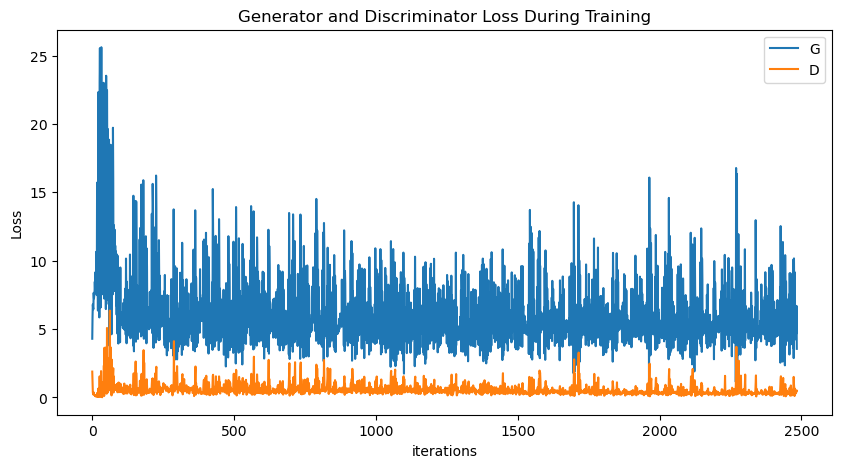

In [17]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

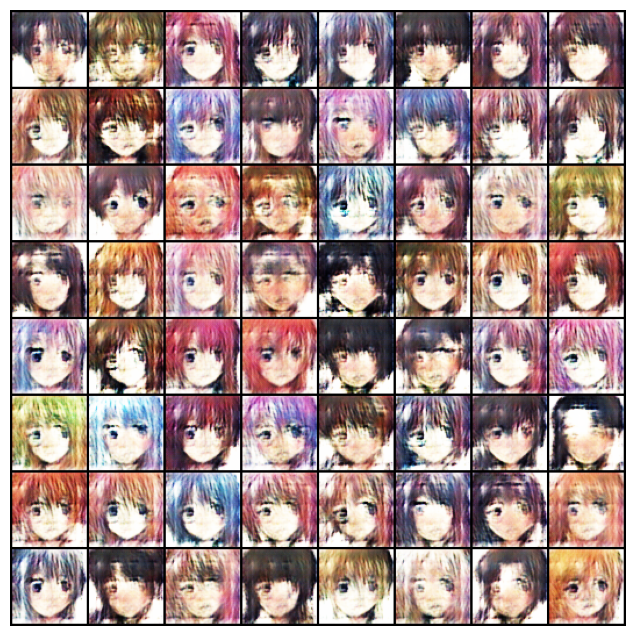

In [18]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

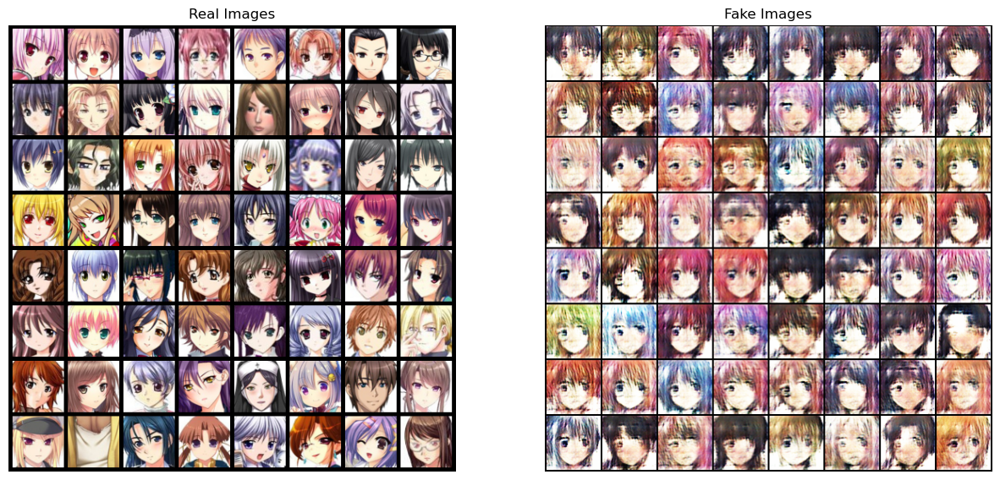

In [19]:
#tomamos un lote de imágenes reales

real_batch = next(iter(dataloader))

# graficamos imágenes reales
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# graficamos las imágenes falsas del último epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [23]:
# Generar una muestra de ruido aleatorio
random_noise = torch.randn(1, 100, 1, 1)  # Ajusta latent_dim al tamaño de tu espacio latente

# Generar la imagen falsa utilizando el generador
fake_image = Generator(random_noise)

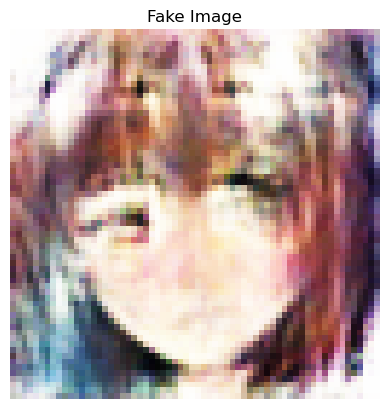

In [33]:
import matplotlib.pyplot as plt

# Generar una muestra de ruido aleatorio
nz = 100  # Ajusta el tamaño de tu espacio latente según tu generador
noise = torch.randn(1, nz, 1, 1, device=device)

# Generar una imagen falsa utilizando el generador
fake_image = netG(noise)

# Ajustar la escala de los valores de píxeles a [0, 1]
fake_image = (fake_image + 1) / 2  # Ajustar la escala de los valores de píxeles a [0, 1]

# Mostrar la imagen generada
plt.imshow(fake_image[0].detach().cpu().permute(1, 2, 0))
plt.axis("off")
plt.title("Fake Image")
plt.show()

In [34]:
# Guardar el modelo del generador en un archivo
torch.save(netG.state_dict(), 'generador.pth')